In [2]:
import importlib

import anndata
import numpy as np
import pandas as pd
import datatable as dt

import matplotlib.pyplot as plt

In [3]:
from rich import print
from rich.traceback import install
install()

<bound method InteractiveShell.excepthook of <ipykernel.zmqshell.ZMQInteractiveShell object at 0x7fce85a0abb0>>

In [4]:
import pipeline
pipeline = importlib.reload(pipeline)

1


### scRNAseq Benchmark datasets - Inter-dataset - Brain

In [57]:
DATA_DIRS = [
    '/home/tiankang/wusuowei/data/single_cell/MARS/scRNAseq_Benchmark_datasets/Inter-dataset/Brain/MouseALM_HumanMTG/',
    '/home/tiankang/wusuowei/data/single_cell/MARS/scRNAseq_Benchmark_datasets/Inter-dataset/Brain/MouseV1_HumanMTG',
    '/home/tiankang/wusuowei/data/single_cell/MARS/scRNAseq_Benchmark_datasets/Inter-dataset/Brain/MouseV1_MouseALM',
    '/home/tiankang/wusuowei/data/single_cell/MARS/scRNAseq_Benchmark_datasets/Inter-dataset/Brain/MouseV1_MouseALM_HumanMTG'
    ]

In [19]:
print('| cell type | counts |\n| ---- | ---- |')
for i, j in pd.read_csv(DATA_DIR + 'MouseALM_HumanMTG_Labels3.csv').value_counts().iteritems():
    print(f'| {i[0]} | {j} |')

| cell type | counts |
| ---- | ---- |

| Excitatory | 14357 |

| Inhibitory | 7661 |

| Non-neuronal | 165 |

In [20]:
print('| cell type | counts |\n| ---- | ---- |')
for i, j in pd.read_csv(DATA_DIR + 'MouseALM_HumanMTG_Labels34.csv').value_counts().iteritems():
    print(f'| {i[0]} | {j} |')

| cell type | counts |
| ---- | ---- |

| Exc L2/3 IT | 3570 |

| Exc L4/5 IT | 2692 |

| Exc L5/6 IT 2 | 2005 |

| Exc L6 IT 1 | 1535 |

| Pvalb 2 | 1260 |

| Exc L5/6 NP | 871 |

| Exc L5/6 IT 1 | 859 |

| Lamp5 Rosehip | 774 |

| Sst 1 | 665 |

| Vip 4 | 661 |

| Exc L6 CT | 633 |

| Exc L5/6 IT 3 | 549 |

| Sst 5 | 523 |

| Exc L3/5 IT | 503 |

| Exc L6b | 499 |

| Exc L6 IT 2 | 451 |

| Vip 3 | 406 |

| Vip 2 | 360 |

| Vip 5 | 346 |

| Pvalb 1 | 344 |

| Vip 1 | 336 |

| Lamp5 Lhx6 | 282 |

| Sst 4 | 263 |

| Lamp5 2 | 251 |

| Vip Sncg | 249 |

| Lamp5 1 | 236 |

| Sst 2 | 210 |

| Exc L5 PT | 190 |

| Sst 3 | 180 |

| Pax6 | 132 |

| Astrocyte | 117 |

| Sst Chodl | 108 |

| Chandelier | 75 |

| Oligo | 48 |

In [5]:
%time temp_df = dt.fread(DATA_DIR + 'MouseALM_HumanMTG.csv').to_pandas()
temp_df

CPU times: user 1h 29min 59s, sys: 23.9 s, total: 1h 30min 23s
Wall time: 1min 43s


,C87437,X0610007P14Rik,X0610009O20Rik,X0610010F05Rik,X0610011F06Rik,X0610030E20Rik,X0610037L13Rik,X0610040J01Rik,X1110001J03Rik,X1110004E09Rik,...,Zwint,Zxdb,Zxdc,Zyg11a,Zyg11b,Zyx,Zzef1,Zzz3,a,l7Rn6
0,F1S4_180124_314_A01,80,11,135,32,0,31,1,49,22,...,3190,0,17,0,96,0,0,45,0,73
1,F1S4_180124_315_A01,233,37,183,114,0,189,0,244,23,...,4832,28,33,0,179,0,0,83,0,127
2,F1S4_180124_315_B01,142,4,129,9,14,73,0,196,57,...,3487,29,4,0,124,33,37,21,0,93
3,F1S4_180124_315_C01,54,1,28,40,17,67,0,55,36,...,3891,13,0,0,98,0,5,18,0,135
4,F1S4_180124_315_D01,139,0,22,117,10,105,0,91,70,...,4537,0,0,0,93,26,22,29,0,81
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22178,F2S4_170405_060_A01,46,34,232,51,0,41,0,0,0,...,0,0,49,0,160,51,46,352,0,76
22179,F2S4_170405_060_B01,0,186,156,29,0,0,0,0,54,...,75,0,87,0,128,72,22,370,1,69
22180,F2S4_170405_060_C01,90,237,456,98,28,0,0,0,1,...,115,0,171,1,79,23,0,113,26,0
22181,F2S4_170405_060_E01,0,0,400,0,0,92,94,0,0,...,0,0,141,0,0,62,316,187,0,0


In [6]:
temp_df.set_index(temp_df.columns[0], inplace=True)

In [7]:
temp_df.index.rename('cell', inplace=True)
temp_df.columns.rename('gene', inplace=True)

In [9]:
temp_df.head(20)

gene,X0610007P14Rik,X0610009O20Rik,X0610010F05Rik,X0610011F06Rik,X0610030E20Rik,X0610037L13Rik,X0610040J01Rik,X1110001J03Rik,X1110004E09Rik,X1110004F10Rik,...,Zwint,Zxdb,Zxdc,Zyg11a,Zyg11b,Zyx,Zzef1,Zzz3,a,l7Rn6
cell,,,,,,,,,,,,,,,,,,,,,
F1S4_180124_314_A01,80,11,135,32,0,31,1,49,22,204,...,3190,0,17,0,96,0,0,45,0,73
F1S4_180124_315_A01,233,37,183,114,0,189,0,244,23,484,...,4832,28,33,0,179,0,0,83,0,127
F1S4_180124_315_B01,142,4,129,9,14,73,0,196,57,479,...,3487,29,4,0,124,33,37,21,0,93
F1S4_180124_315_C01,54,1,28,40,17,67,0,55,36,388,...,3891,13,0,0,98,0,5,18,0,135
F1S4_180124_315_D01,139,0,22,117,10,105,0,91,70,579,...,4537,0,0,0,93,26,22,29,0,81
F1S4_180124_315_E01,106,0,0,115,17,109,0,189,149,464,...,5402,0,0,0,101,132,111,101,0,171
F1S4_180124_315_F01,77,2,92,85,35,182,0,119,64,412,...,3321,0,0,0,57,5,42,2,0,275
F1S4_180124_315_G01,216,4,75,34,6,184,1,71,190,475,...,2946,25,22,0,69,0,5,37,0,194
F1S4_180124_315_H01,54,3,106,71,10,168,0,86,57,531,...,3389,0,17,0,79,0,39,18,0,291


In [26]:
temp_df.size

356436444

In [32]:
(temp_df == 0).sum().sum() / (temp_df.size)

0.5389944834036107

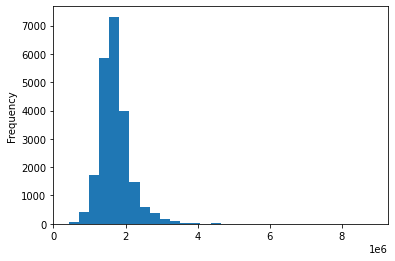

In [37]:
temp_df.sum(axis=1).plot(kind='hist', bins=30)
plt.savefig('./explore/imgs/MouseALM_HumanMTG_count_hist.jpg')

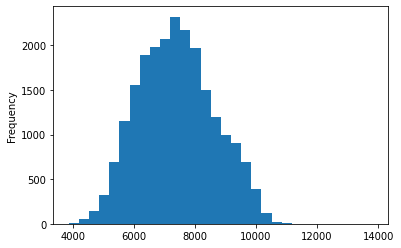

In [38]:
(temp_df != 0).sum(axis=1).plot(kind='hist', bins=30)
plt.savefig('./explore/imgs/MouseALM_HumanMTG_gene_hist.jpg')

In [8]:
temp_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 22183 entries, F1S4_180124_314_A01 to F2S4_170405_060_H01
Columns: 16068 entries, X0610007P14Rik to l7Rn6
dtypes: bool(12), int32(16056)
memory usage: 1.3+ GB


In [16]:
brain_X_normalized = pipeline.normalize(temp_df.values, apply_qc=False)

(22183, 16068)
Median: 1647731.0


In [17]:
umap_object, brain_X_umap = pipeline.umap(brain_X_normalized)

In [25]:
{label:idx for idx, label in enumerate(pd.read_csv(DATA_DIR + 'MouseALM_HumanMTG_Labels3.csv', squeeze=True).unique())}

{'Excitatory': 0, 'Inhibitory': 1, 'Non-neuronal': 2}

In [31]:
def label_to_idx(series: pd.Series) -> list:
    label_to_idx_dict = {label: idx for idx, label in enumerate(series.unique())}
    return list(map(lambda label: label_to_idx_dict[label], series)), label_to_idx_dict

In [36]:
brain_labels_coarse = label_to_idx(pd.read_csv(DATA_DIR + 'MouseALM_HumanMTG_Labels3.csv', squeeze=True))
brain_labels_refined = label_to_idx(pd.read_csv(DATA_DIR + 'MouseALM_HumanMTG_Labels34.csv', squeeze=True))

In [37]:
pipeline.plot(brain_X_umap, labels=brain_labels_coarse, backend='plotly')

In [40]:
pipeline.plot(brain_X_umap, labels=brain_labels_refined, backend='plotly')

In [42]:
pipeline.plot(brain_X_umap[:8128], labels=brain_labels_refined[:8128], backend='plotly')

In [43]:
pipeline.plot(brain_X_umap[8128:], labels=brain_labels_refined[8128:], backend='plotly')

In [44]:
np.save(DATA_DIR + 'cached/noqc_log_umap3d.npy', brain_X_umap)

In [52]:
temp_df.index.to_series().to_csv(DATA_DIR + 'cached/cell_index.csv')

In [53]:
temp_df.reset_index(drop=True, inplace=True)

In [58]:
temp_df[:8128].to_feather(DATA_DIR + 'cached/MouseALM.feather')

In [60]:
temp_df[8128:].reset_index().to_feather(DATA_DIR + 'cached/HumanMTG.feather')

In [55]:
%time temp_df = pd.read_feather(DATA_DIR + 'cached/MouseALM_HumanMTG.feather')

CPU times: user 2.51 s, sys: 7.02 s, total: 9.53 s
Wall time: 822 ms


In [63]:
print(1)

1

In [5]:
%time temp_df2 = dt.fread('/home/tiankang/wusuowei/data/single_cell/MARS/scRNAseq_Benchmark_datasets/Inter-dataset/Brain/MouseV1_MouseALM_HumanMTG/MouseV1_MouseALM_HumanMTG.csv').to_pandas()
temp_df2

CPU times: user 1h 49min 4s, sys: 23.9 s, total: 1h 49min 28s
Wall time: 3min 16s


,C87437,X0610007P14Rik,X0610009O20Rik,X0610010F05Rik,X0610011F06Rik,X0610030E20Rik,X0610037L13Rik,X0610040J01Rik,X1110001J03Rik,X1110004E09Rik,...,Zwint,Zxdb,Zxdc,Zyg11a,Zyg11b,Zyx,Zzef1,Zzz3,a,l7Rn6
0,F1S4_160108_001_A01,79,123,0,150,16,110,0,206,0,...,5831,0,0,0,78,0,36,1,0,190
1,F1S4_160108_001_B01,123,2,337,61,10,383,0,48,75,...,10305,0,0,0,69,0,78,29,0,179
2,F1S4_160108_001_C01,89,29,112,79,0,160,0,88,36,...,7260,0,0,2,273,38,110,81,0,178
3,F1S4_160108_001_D01,115,50,35,0,90,189,0,117,44,...,7451,0,0,0,151,165,67,30,0,110
4,F1S4_160108_001_E01,402,0,0,0,71,114,0,162,129,...,8383,20,0,1,99,50,83,69,0,335
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34730,F2S4_170405_060_A01,46,34,232,51,0,41,0,0,0,...,0,0,49,0,160,51,46,352,0,76
34731,F2S4_170405_060_B01,0,186,156,29,0,0,0,0,54,...,75,0,87,0,128,72,22,370,1,69
34732,F2S4_170405_060_C01,90,237,456,98,28,0,0,0,1,...,115,0,171,1,79,23,0,113,26,0
34733,F2S4_170405_060_E01,0,0,400,0,0,92,94,0,0,...,0,0,141,0,0,62,316,187,0,0


In [6]:
temp_df2.drop(columns=temp_df2.columns[0], inplace=True)
temp_df2

,X0610007P14Rik,X0610009O20Rik,X0610010F05Rik,X0610011F06Rik,X0610030E20Rik,X0610037L13Rik,X0610040J01Rik,X1110001J03Rik,X1110004E09Rik,X1110004F10Rik,...,Zwint,Zxdb,Zxdc,Zyg11a,Zyg11b,Zyx,Zzef1,Zzz3,a,l7Rn6
0,79,123,0,150,16,110,0,206,0,291,...,5831,0,0,0,78,0,36,1,0,190
1,123,2,337,61,10,383,0,48,75,519,...,10305,0,0,0,69,0,78,29,0,179
2,89,29,112,79,0,160,0,88,36,486,...,7260,0,0,2,273,38,110,81,0,178
3,115,50,35,0,90,189,0,117,44,574,...,7451,0,0,0,151,165,67,30,0,110
4,402,0,0,0,71,114,0,162,129,234,...,8383,20,0,1,99,50,83,69,0,335
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34730,46,34,232,51,0,41,0,0,0,209,...,0,0,49,0,160,51,46,352,0,76
34731,0,186,156,29,0,0,0,0,54,202,...,75,0,87,0,128,72,22,370,1,69
34732,90,237,456,98,28,0,0,0,1,127,...,115,0,171,1,79,23,0,113,26,0
34733,0,0,400,0,0,92,94,0,0,75,...,0,0,141,0,0,62,316,187,0,0


In [8]:
DATA_DIR = '/home/tiankang/wusuowei/data/single_cell/MARS/scRNAseq_Benchmark_datasets/Inter-dataset/Brain/cached/'

In [13]:
# temp_df2[0:12552].to_feather(DATA_DIR + 'MouseV1.feather')
temp_df2[12552:20680].reset_index().to_feather(DATA_DIR + 'MouseALM.feather')
temp_df2[20680:].reset_index().to_feather(DATA_DIR + 'HumanMTG.feather')

In [71]:
temp_df2[12552:]

,X0610005C13Rik,X0610006L08Rik,X0610007P14Rik,X0610009B22Rik,X0610009E02Rik,X0610009L18Rik,X0610009O20Rik,X0610010B08Rik,X0610010F05Rik,X0610010K14Rik,...,Zxdb,Zxdc,Zyg11a,Zyg11b,Zyx,Zzef1,Zzz3,a,l7Rn6,n.R5s136
12552,0,0,80,46,0,0,11,0,135,37,...,0,17,0,96,0,0,45,0,73,0
12553,0,0,233,274,0,0,37,0,183,138,...,28,33,0,179,0,0,83,0,127,0
12554,0,0,142,175,3,26,4,0,129,68,...,29,4,0,124,33,37,21,0,93,0
12555,0,0,54,89,3,0,1,0,28,36,...,13,0,0,98,0,5,18,0,135,0
12556,0,0,139,134,0,17,0,0,22,73,...,0,0,0,93,26,22,29,0,81,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20675,0,0,196,477,0,14,1,0,140,192,...,0,4,0,349,8,40,129,7,210,0
20676,6,16,122,90,0,19,17,0,288,55,...,0,47,0,418,20,62,0,0,222,0
20677,0,0,196,362,0,0,2,0,273,176,...,49,60,0,527,24,123,75,0,485,0
20678,0,0,353,313,0,33,25,0,326,183,...,8,0,0,468,0,91,46,0,166,0


In [70]:
temp_df

,X0610007P14Rik,X0610009O20Rik,X0610010F05Rik,X0610011F06Rik,X0610030E20Rik,X0610037L13Rik,X0610040J01Rik,X1110001J03Rik,X1110004E09Rik,X1110004F10Rik,...,Zwint,Zxdb,Zxdc,Zyg11a,Zyg11b,Zyx,Zzef1,Zzz3,a,l7Rn6
0,80,11,135,32,0,31,1,49,22,204,...,3190,0,17,0,96,0,0,45,0,73
1,233,37,183,114,0,189,0,244,23,484,...,4832,28,33,0,179,0,0,83,0,127
2,142,4,129,9,14,73,0,196,57,479,...,3487,29,4,0,124,33,37,21,0,93
3,54,1,28,40,17,67,0,55,36,388,...,3891,13,0,0,98,0,5,18,0,135
4,139,0,22,117,10,105,0,91,70,579,...,4537,0,0,0,93,26,22,29,0,81
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22178,46,34,232,51,0,41,0,0,0,209,...,0,0,49,0,160,51,46,352,0,76
22179,0,186,156,29,0,0,0,0,54,202,...,75,0,87,0,128,72,22,370,1,69
22180,90,237,456,98,28,0,0,0,1,127,...,115,0,171,1,79,23,0,113,26,0
22181,0,0,400,0,0,92,94,0,0,75,...,0,0,141,0,0,62,316,187,0,0


### scRNAseq Benchmark datasets - Inter-dataset - CellBench

In [39]:
DATA_DIR = '/home/tiankang/wusuowei/data/single_cell/MARS/scRNAseq_Benchmark_datasets/Inter-dataset/CellBench/'

In [ ]:
with open(DATA_DIR + 'Combined_10x_CelSeq2_5cl_data.csv') as f:
    for line in f:
        print(len(line.split(',')))
        print(line.split(','))

In [11]:
cellbench_df = dt.fread(DATA_DIR + 'Combined_10x_CelSeq2_5cl_data.csv').to_pandas()
cellbench_df

╭──────────────────────────── Traceback (most recent call last) ────────────────────────────╮
│ <ipython-input-11-0518c8634a91>:1 in <module>                                             │
│                                                                                           │
│ /home/tiankang/software/anaconda3/lib/python3.8/site-packages/anndata/_io/h5ad.py:413 in  │
│ read_h5ad                                                                                 │
│                                                                                           │
│   410 │   │   read_dense_as_sparse, sparse_format=as_sparse_fmt, axis_chunk=chunk_size    │
│   411 │   )                                                                               │
│   412 │                                                                                   │
│ ❱ 413 │   with h5py.File(filename, "r") as f:                                             │
│   414 │   │   d = {}                                                                      │
│   415 │   │   for k in f.keys():                                                          │
│   416 │   │   │   # Backwards compat for old raw                                          │
│                                                                                           │
│ /home/tiankang/software/anaconda3/lib/python3.8/site-packages/h5py/_hl/files.py:406 in    │
│ __init__                                                                                  │
│                                                                                           │
│   403 │   │   │                                                                           │
│   404 │   │   │   with phil:                                                              │
│   405 │   │   │   │   fapl = make_fapl(driver, libver, rdcc_nslots, rdcc_nbytes, rdcc_w0, │
│ ❱ 406 │   │   │   │   fid = make_fid(name, mode, userblock_size,                          │
│   407 │   │   │   │   │   │   │      fapl, fcpl=make_fcpl(track_order=track_order),       │
│   408 │   │   │   │   │   │   │      swmr=swmr)                                           │
│                                                                                           │
│ /home/tiankang/software/anaconda3/lib/python3.8/site-packages/h5py/_hl/files.py:173 in    │
│ make_fid                                                                                  │
│                                                                                           │
│   170 │   │   flags = h5f.ACC_RDONLY                                                      │
│   171 │   │   if swmr and swmr_support:                                                   │
│   172 │   │   │   flags |= h5f.ACC_SWMR_READ                                              │
│ ❱ 173 │   │   fid = h5f.open(name, flags, fapl=fapl)                                      │
│   174 │   elif mode == 'r+':                                                              │
│   175 │   │   fid = h5f.open(name, h5f.ACC_RDWR, fapl=fapl)                               │
│   176 │   elif mode in ['w-', 'x']:                                                       │
│                                                                                           │
│ /home/tiankang/wusuowei/deeplearning/single_cell/babel/denoise/h5py/_objects.pyx:54 in    │
│ h5py._objects.with_phil.wrapper                                                           │
│                                                                                           │
│ [Errno 2] No such file or directory:                                                      │
│ '/home/tiankang/wusuowei/deeplearning/single_cell/babel/denoise/h5py/_objects.pyx'        │
│                                                                                           │
│ /home/tiankang/wusuowei/deeplearning/single_cell/babel/denoise/h5py/_objects.pyx:55 in    │
│ h5py._objects.with_phil.wrapper                   